In [4]:
!python -m venv .venv

The virtual environment was not created successfully because ensurepip is not
available.  On Debian/Ubuntu systems, you need to install the python3-venv
package using the following command.

    apt install python3.10-venv

You may need to use sudo with that command.  After installing the python3-venv
package, recreate your virtual environment.

Failing command: /content/.venv/bin/python3



In [5]:
!source .venv/bin/activate; python -m pip install pyyaml==6.0
!source .venv/bin/activate; python -m pip install Pillow
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!source .venv/bin/activate; python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

/bin/bash: line 1: .venv/bin/activate: No such file or directory
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 682.2/682.2 kB 8.0 MB/s eta 0:00:00
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
llmx 0.0.15a0 requires cohere, which is not installed.
llmx 0.0.15a0 requires openai, which is not installed.
llmx 0.0.15a0 requires tiktoken, which is not installed.
/bin/bash: line 1: .venv/bin/activate: No such file or directory
Cloning into 'detectron2'...
remote: Enumerating objects: 15292, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 15292 (delta 3), reused 6 (delta 1), pack-reused 15275
Receiving objects: 100% (15292/15292), 6.18 MiB | 10.87 MiB

In [6]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.1 ; cuda:  cu118
detectron2: 0.6


In [7]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
#from detectron2.utils.logger import setup_logger
#setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from PIL import Image
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [114]:
#Importing images from dataset
from google.colab import drive
drive.mount('/content/drive')

img_folder = "/content/drive/MyDrive/Exame_VAR/dataset/Offside_Images"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


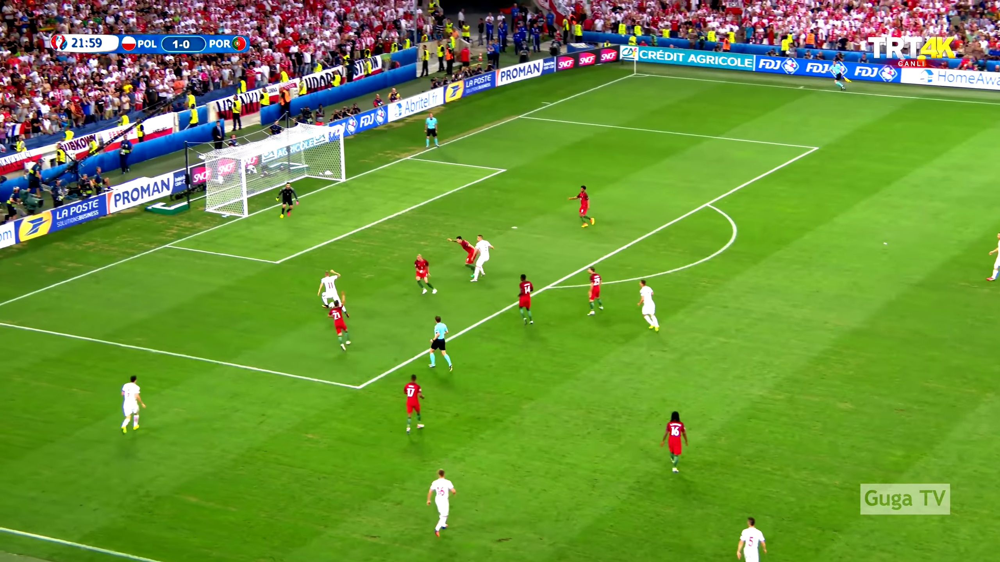

In [9]:
my_image = cv2.imread(f"{img_folder}/4.jpg")
cv2_imshow(my_image)

In [129]:
# Using panoptic segmentation to get field area
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
panoptic_predictor = DefaultPredictor(cfg)

# keypoint detection model
cfg_keypoint = get_cfg()   # get a fresh new config
cfg_keypoint.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg_keypoint.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg_keypoint.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
keypoint_predictor = DefaultPredictor(cfg_keypoint)


In [11]:
def isolate_field(image, panoptic_predictor):
    panoptic_seg, segments_info = panoptic_predictor(image)["panoptic_seg"]
    v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
    out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
    max_person_area = 0

    for info in segments_info:
        if(info['category_id'] == 18): # playing field
            field_id = info['id']

        if(info['category_id'] == 0):  # person
            max_person_area = max(max_person_area, info['area'])

    dilate_size = round(np.sqrt(max_person_area)*1.5)
    erode_size = round(np.sqrt(max_person_area)/2)

    dilate_box = np.ones((dilate_size, dilate_size))
    erode_box = np.ones((erode_size, erode_size))


    field_area = np.where(np.array(panoptic_seg.cpu()) == field_id, 255, 0)
    field_area = np.array(field_area, np.uint8)
    field_area = cv2.erode(field_area, erode_box)
    field_area = cv2.dilate(field_area, dilate_box)

    edited_image = image.copy()
    edited_image[field_area == 0] = 0

    return edited_image


In [12]:
def get_people_keypoints(image, panoptic_predictor, keypoint_predictor):
    outputs = keypoint_predictor(isolate_field(image, panoptic_predictor))

    people = []

    # Iterate through keypoints and add them to list
    keypoints = outputs["instances"].pred_keypoints.cpu()
    for i, instance_keypoints in enumerate(keypoints):
        person_info = dict()
        person_info['keypoints'] = np.concatenate((instance_keypoints[0:1,:2], instance_keypoints[5:6,:2],
                                            instance_keypoints[11:12,:2], instance_keypoints[13:14,:2],
                                            instance_keypoints[15:,:2], instance_keypoints[14:15,:2],
                                            instance_keypoints[12:13,:2],instance_keypoints[6:7,:2]), axis=0).tolist()
        person_info['player_id'] = i
        people.append(person_info)

    return people

# Lendo keypoints do dataset

In [ ]:
'''
import re

def extract_number_from_filename(filename):
   match = re.search(r'\d+', filename)
   if match:
       return int(match.group(0))
   else:
       return None

def dataset_players_infos(img_folder):
    json_file = os.path.join(img_folder, "final_data.json")
    with open(json_file) as f:
        img_data_list = json.load(f)

    dataset_dicts = []
    for img_data in img_data_list:
        data_with_error = False
        if type(img_data["Pose"]) != str:
            record = {}
            filename = os.path.join(img_folder, img_data["Image_ID"])
            height, width = cv2.imread(filename).shape[:2]

            record["file_name"] = filename
            record["image_id"] = extract_number_from_filename(filename)
            record["height"] = height
            record["width"] = width

            players = []
            id = 0
            for team in (img_data["Pose"]).keys():
                for player in img_data["Pose"][team]:
                    player_info = dict()
                    keypoint_list = []
                    keypoints = player["geometry"]

                    if len(keypoints) != 9:
                        data_with_error = True
                    for keypoint in keypoints:
                        x = float(keypoint["x"])
                        y = float(keypoint["y"])
                        keypoint_list.append([x,y])

                    player_info["keypoints"] = keypoint_list
                    player_info["player_id"] = id
                    player_info["team"] = team
                    players.append(player_info)

                    id += 1

            record["players"] = players

        if not data_with_error:
            dataset_dicts.append(record)

    return dataset_dicts

dataset_players = dataset_players_infos(img_folder)

with open('/content/converted_dataset.json', 'w') as f:
   json.dump(dataset_players, f)
'''

In [15]:
with open(f'{img_folder}/converted_dataset.json', 'r') as f:
    dataset_players = json.load(f)

# Pegando keypoints de todas as imagens com detectron

In [ ]:
'''
detectron_players = []

for image in dataset_players:
    image_info = dict()
    file_name = image['file_name']

    image_info['file_name'] = file_name
    image_info['image_id'] = image['image_id']
    image_info['height'] = image['height']
    image_info['width'] = image['width']
    image_info['players'] = get_people_keypoints(cv2.imread(file_name), panoptic_predictor, keypoint_predictor)
    detectron_players.append(image_info)

with open('/content/detectron_dataset.json', 'w') as f:
   json.dump(detectron_players, f)
'''

In [16]:
with open(f'{img_folder}/detectron_dataset.json', 'r') as f:
    detectron_players = json.load(f)

# Convertendo keypoints para arrays

In [17]:
def keypoint_list_to_array(dataset_dict):
    dataset_copy = dataset_dict.copy()
    for image in dataset_copy:
        keypoints_arrays = [np.array(player['keypoints'])[..., None] for player in image['players']]
        image['keypoint_array'] = np.concatenate(keypoints_arrays, -1)
    return dataset_copy

In [56]:
dataset_images = keypoint_list_to_array(dataset_players)
detectron_images = keypoint_list_to_array(detectron_players)

valid_dataset_images = dataset_images[350:]
valid_detectron_images = detectron_images[350:]
dataset_images = dataset_images[0:350]
detectron_images = detectron_images[0:350]

In [ ]:
len(dataset_images)

417

In [19]:
'''
for i, image in enumerate(dataset_images):
    dataset_array = image['keypoint_array'][:, :, None, :]
    detectron_array = detectron_images[i]['keypoint_array'][..., None]

    mse_array = np.power(dataset_array - detectron_array, 2)
'''

def associate_players(dataset_array, detectron_array, max_mse = 1e3):
    mse_array = np.mean(
        np.power(dataset_array[:, :, None, :] - detectron_array[..., None], 2),
        axis = (0,1)
    )

    total_players = mse_array.shape[1]

    associated_id = mse_array.argmin(axis = 1)
    min_mse = np.min(mse_array, axis = 1)

    associations = dict()
    min_mse_for_player = [max_mse] * total_players
    for id_detectron, id_dataset in enumerate(associated_id):
        if min_mse_for_player[associated_id[id_detectron]] > min_mse[id_detectron]:
            associations[id_dataset] = id_detectron
            min_mse_for_player[id_dataset] = min_mse[id_detectron]

    detected_players = len(associations)

    return associations, min_mse, total_players, detected_players

In [17]:
image = cv2.imread(dataset_images[2]['file_name'])
dataset_array = dataset_images[2]['keypoint_array']
detectron_array = detectron_images[2]['keypoint_array']

associations, mse, total_players, detected_players = associate_players(dataset_array, detectron_array)
print(associations)
print(mse)
print(total_players)
print(detected_players)

{10: 0, 11: 1, 12: 2, 9: 3, 0: 5, 6: 6, 14: 7, 7: 10, 4: 11, 8: 12, 5: 13, 2: 14, 13: 15}
[2.10888359e+01 9.08136565e+01 9.75665648e+00 2.78567391e+01
 5.64880559e+04 1.92225775e+01 2.18989319e+01 1.70717311e+02
 1.47358156e+04 4.05495126e+05 5.58631065e+01 3.12494783e+01
 1.29750928e+01 6.31249426e+01 7.65609720e+01 1.17494259e+02
 1.33029864e+03]
15
13


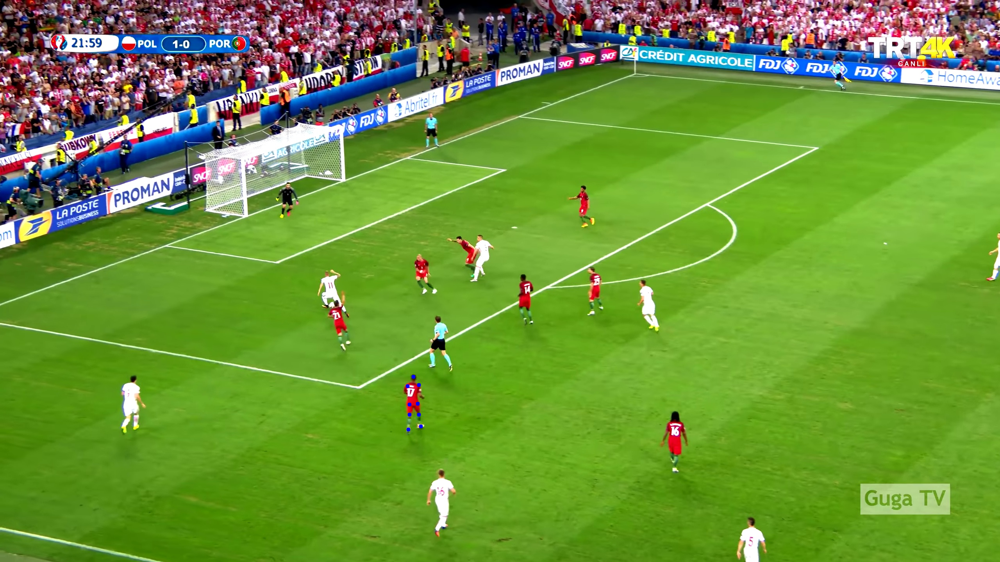

In [18]:
im_dataset = image.copy()
im_detectron = image.copy()

# Iterate through keypoints and plot them
person_dataset = dataset_images[2]['players'][0]
for keypoint in person_dataset['keypoints']:
    x, y = keypoint
    x = round(x)
    y = round(y)
    im_dataset = cv2.circle(im_dataset, center=(x,y), color=(255,0,0), radius=5, thickness=-1)

cv2_imshow(im_dataset)

person_detectron = detectron_images[2]['players'][4]
for keypoint in person_detectron['keypoints']:
    x, y = keypoint
    x = round(x)
    y = round(y)
    im_detectron = cv2.circle(im_detectron, center=(x,y), color=(0,0,255), radius=5, thickness=-1)

#cv2_imshow(im_detectron)

In [20]:
def get_associated_players(dataset_images, detectron_images):
    associations_list = []
    for i, dataset_image in enumerate(dataset_images):
        association_dict = dict()
        association_dict['image_id'] = dataset_image['image_id']
        dataset_array = dataset_image['keypoint_array']
        detectron_array = detectron_images[i]['keypoint_array']
        associations, mse, total_players, detected_players = associate_players(dataset_array, detectron_array)
        association_dict['associations'] = associations
        association_dict['mse'] = mse
        association_dict['total_players'] = total_players
        association_dict['detected_players'] = detected_players
        associations_list.append(association_dict)
    return associations_list



In [59]:
associations_list = get_associated_players(dataset_images, detectron_images)

In [60]:
associations_list

[{'image_id': 1,
  'associations': {7: 0,
   2: 1,
   9: 2,
   1: 4,
   10: 5,
   6: 6,
   0: 7,
   3: 9,
   8: 11,
   5: 13},
  'mse': array([1.90402939e+02, 1.64943802e+02, 8.13194506e+01, 1.01952372e+05,
         8.20183875e+01, 1.50406967e+02, 1.40512794e+02, 7.95184145e+01,
         4.61783405e+03, 1.92328563e+02, 2.68971209e+03, 4.88841675e+02,
         1.23873401e+05, 1.22640193e+02]),
  'total_players': 11,
  'detected_players': 10},
 {'image_id': 3,
  'associations': {9: 0,
   1: 1,
   8: 2,
   4: 3,
   0: 5,
   3: 8,
   6: 9,
   5: 10,
   7: 11,
   2: 12},
  'mse': array([2.88021183e+01, 3.69988152e+01, 2.30161629e+01, 1.72999788e+02,
         6.02729752e+04, 3.94218370e+02, 2.12518008e+04, 9.88196037e+03,
         3.47279352e+02, 2.17847354e+02, 2.54569541e+02, 4.27890400e+02,
         8.22577483e+01]),
  'total_players': 10,
  'detected_players': 10},
 {'image_id': 4,
  'associations': {10: 0,
   11: 1,
   12: 2,
   9: 3,
   0: 5,
   6: 6,
   14: 7,
   7: 10,
   4: 11,
   8

In [21]:
total = sum([image['total_players'] for image in associations])
detected = sum([image['detected_players'] for image in associations])

detected/total

0.9500544860152561

# Fazendo clusters de times

In [21]:
def get_mean_color(image, points):
    mask = np.zeros(image.shape[:2], dtype="uint8")
    cv2.fillPoly(mask, np.int32([points]), 255)
    mean_color = cv2.mean(image, mask=mask)[:-1]
    return mean_color


In [22]:
def show_color(bgr_array):
    image = np.zeros((1, 1, 3), dtype="uint8")
    image[0, 0] = bgr_array[::-1]

    # Display the image
    plt.imshow(image)
    plt.figure(figsize=(1,1))
    plt.axis('off') # Hide axes
    plt.show()


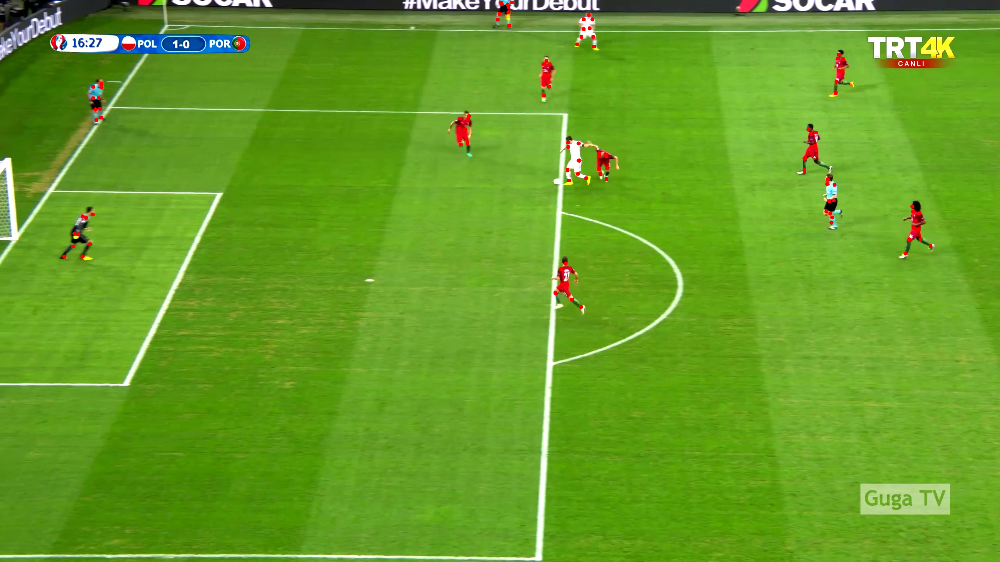

In [49]:
image_info = detectron_images[1]
dataset_image_info = dataset_images[1]

my_image = cv2.imread(image_info['file_name'])
people = image_info['players']

im = my_image.copy()

# Iterate through keypoints and plot them
for person in people:
    for keypoint in person['keypoints']:
        x, y = keypoint
        x = round(x)
        y = round(y)
        im = cv2.circle(im, center=(x,y), color=(0,0,255), radius=5, thickness=-1)

cv2_imshow(im)

In [23]:
from sklearn.cluster import DBSCAN

def color_amplify(color_array):

    sum_colors = np.sum(color_array, axis = 1)[:, None]
    normalized = color_array/sum_colors
    transformer = np.exp(2*normalized) - 1
    transformed = normalized*transformer
    normalized_transformed = transformed/np.sum(transformed, axis = 1)[:, None]

    return np.clip(normalized_transformed * sum_colors, 0, 255)

def cluster_teams(image_info, eps = 55):
    n_samples = len(image_info['players'])
    image = cv2.imread(image_info['file_name'])
    player_colors = []
    for player in image_info['players']:
        keypoints = player['keypoints']
        points = np.array([keypoints[1], keypoints[2], keypoints[7], keypoints[8]])
        player_colors.append(get_mean_color(image, points))

    amplified = color_amplify(np.array(player_colors))
    db = DBSCAN(eps=eps, min_samples=1)
    db.fit(amplified)
    return db.labels_

In [ ]:
clusters, colors = cluster_teams(image_info, eps = 55)
clusters

for i, color in enumerate(colors):
    print(clusters[i], color)
    show_color(color)

# Avaliar o modelo DBSCAN para keypoints do detectron

In [24]:
from collections import Counter

def get_teams(labels):
    counter = Counter(labels)
    team1 = max(counter, key=counter.get)
    counter.pop(team1)
    team2 = max(counter, key=counter.get)

    return team1, team2

def verify_gk(labels, player_category):
    t1, t2 = get_teams(labels)
    return (player_category != t1 and player_category != t2)

In [36]:
def get_best_eps(dataset_images, detectron_images):

    for eps in np.arange(30, 75, 5):
        total_gk = 0
        correct_gk = 0

        for image_idx, (dataset_image, detectron_image) in enumerate(zip(dataset_images, detectron_images)):
            associations, _,_,_ = associate_players(dataset_image['keypoint_array'], detectron_image['keypoint_array'])
            labels = cluster_teams(detectron_image, eps)

            for i, dataset_player in enumerate(dataset_image['players']):
                if dataset_player['team'] == 'GK' and i in associations.keys():
                    total_gk += 1
                    if verify_gk(labels, labels[associations[i]]):
                        correct_gk += 1

        field_players = 0
        wrong_gk = 0

        for image_idx, (dataset_image, detectron_image) in enumerate(zip(dataset_images, detectron_images)):
            associations, _,_,_ = associate_players(dataset_image['keypoint_array'], detectron_image['keypoint_array'])
            labels = cluster_teams(detectron_image, eps)
            team1, team2 = get_teams(labels)
            for i, dataset_player in enumerate(dataset_image['players']):
                if (dataset_player['team'] == 'Team1' or dataset_player['team'] == 'Team2') and i in associations.keys():
                    field_players += 1
                    if labels[associations[i]] != team1 and labels[associations[i]] != team2:
                        wrong_gk += 1

        print(f'eps = {eps}: find_gk = {correct_gk/total_gk}, wrong_gk = {wrong_gk/field_players}')

get_best_eps(dataset_images, detectron_images)

eps = 30: find_gk = 0.9820143884892086, wrong_gk = 0.27320099255583125
eps = 35: find_gk = 0.9928057553956835, wrong_gk = 0.22109181141439205
eps = 40: find_gk = 0.9928057553956835, wrong_gk = 0.17295285359801488
eps = 45: find_gk = 0.9928057553956835, wrong_gk = 0.13300248138957815
eps = 50: find_gk = 0.9892086330935251, wrong_gk = 0.10893300248138958
eps = 55: find_gk = 0.9784172661870504, wrong_gk = 0.09057071960297766
eps = 60: find_gk = 0.9568345323741008, wrong_gk = 0.07419354838709677
eps = 65: find_gk = 0.9388489208633094, wrong_gk = 0.05806451612903226
eps = 70: find_gk = 0.920863309352518, wrong_gk = 0.04640198511166253


Será utilizado eps = 55 como default (98% de identificar goleiro e 9% de falso positivo)

In [107]:
total_gk = 0
correct_gk = 0

error_list = []

for image_idx, (dataset_image, detectron_image) in enumerate(zip(dataset_images, detectron_images)):
    associations, _,_,_ = associate_players(dataset_image['keypoint_array'], detectron_image['keypoint_array'])
    labels = cluster_teams(detectron_image)

    for i, dataset_player in enumerate(dataset_image['players']):
        if dataset_player['team'] == 'GK' and i in associations.keys():
            total_gk += 1
            if verify_gk(labels, labels[associations[i]]):
                correct_gk += 1
            else:
                error_list.append(image_idx)

In [41]:
list(set(error_list))

[128, 101, 325, 73, 267, 277]

In [75]:
field_players = 0
wrong_gk = 0

error_list = []

for image_idx, (dataset_image, detectron_image) in enumerate(zip(dataset_images, detectron_images)):
    associations, _,_,_ = associate_players(dataset_image['keypoint_array'], detectron_image['keypoint_array'])
    labels = cluster_teams(detectron_image)
    team1, team2 = get_teams(labels)
    for i, dataset_player in enumerate(dataset_image['players']):
        if (dataset_player['team'] == 'Team1' or dataset_player['team'] == 'Team2') and i in associations.keys():
            field_players += 1
            if labels[associations[i]] != team1 and labels[associations[i]] != team2:
                wrong_gk += 1
                error_list.append(image_idx)

In [76]:
wrong_gk/field_players

0.09057071960297766

In [58]:
len(set(error_list))

191

In [79]:
wrong_gk

365

# Classificação de times com Gaussian Mixture Model


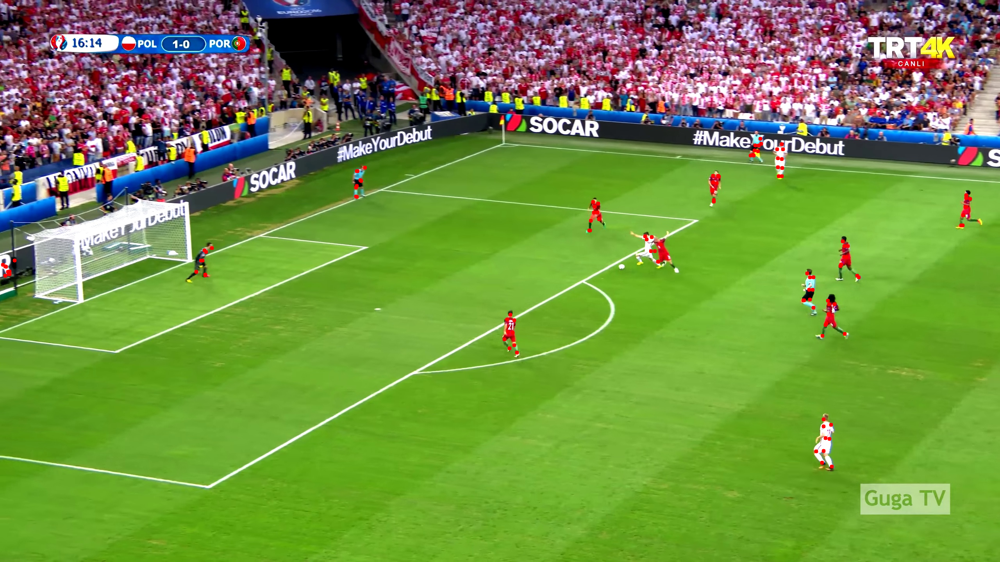

In [35]:
image_info = detectron_images[0]
dataset_image_info = dataset_images[0]

my_image = cv2.imread(image_info['file_name'])
people = image_info['players']

im = my_image.copy()

# Iterate through keypoints and plot them
for person in people:
    for keypoint in person['keypoints']:
        x, y = keypoint
        x = round(x)
        y = round(y)
        im = cv2.circle(im, center=(x,y), color=(0,0,255), radius=5, thickness=-1)

cv2_imshow(im)

In [37]:
def segregate_field_players(image_info):
    clusters = cluster_teams(image_info)
    team1, team2 = get_teams(clusters)

    return [player for player in image_info['players'] if clusters[player['player_id']] in (team1, team2)], [player for player in image_info['players'] if clusters[player['player_id']] not in (team1, team2)]

def lab_transform(color_array):
    reshaped_array = np.uint8(color_array.reshape(-1, 1, 3))
    return cv2.cvtColor(reshaped_array, cv2.COLOR_BGR2LAB).reshape(-1, 3)

In [43]:
from sklearn.datasets import make_classification
from sklearn.mixture import GaussianMixture

def classify_teams(image_info):
    field_players, other_players = segregate_field_players(image_info)
    n_samples = len(field_players)
    image = cv2.imread(image_info['file_name'])
    field_player_colors = []
    for player in field_players:
        keypoints = player['keypoints']
        points = np.array([keypoints[1], keypoints[2], keypoints[7], keypoints[8]])
        field_player_colors.append(get_mean_color(image, points))

    field_lab_colors = lab_transform(np.array(field_player_colors))
    gaussian_model = GaussianMixture(n_components=2, random_state=0)
    gaussian_model.fit(field_lab_colors)
    field_players_result = gaussian_model.predict(field_lab_colors)

    field_players_id = [player['player_id'] for player in field_players]
    other_players_id = [player['player_id'] for player in other_players]

    field_players_dict = dict(zip(field_players_id, field_players_result))

    return field_players_dict, field_players_id, other_players_id

In [53]:
'''classif_detectron_images = detectron_images.copy()

for image_info in classif_detectron_images:
    image_info.pop('keypoint_array')
    field_players_dict, field_players_id, other_players_id = classify_teams(image_info)
    for id in field_players_id:
        image_info['players'][id]['team'] = f'Team{field_players_dict[id]+1}'
    for id in other_players_id:
        image_info['players'][id]['team'] = 'GK'

with open('/content/classif_detectron_dataset.json', 'w') as f:
   json.dump(classif_detectron_images, f)'''

In [ ]:
with open(f'{img_folder}/classif_detectron_dataset.json', 'r') as f:
    classif_detectron_images = json.load(f)

# Avaliando classificações

In [103]:
wrong_team = 0
no_team = 0
gk_error = 0
total_assoc_players = 0
classif_error = 0

teams = ('Team1', 'Team2')

for i, (dataset_image, detectron_image) in enumerate(zip(dataset_images, classif_detectron_images)):
    associations = associations_list[i]['associations']

    correct_team_classif = 0
    for ds_player_id, ds_player in enumerate(dataset_image['players']):
        if ds_player_id in associations.keys():
            dtc_player_id = associations[ds_player_id]
            dtc_player = detectron_image['players'][dtc_player_id]
            if dtc_player['team'] in teams and ds_player['team'] in teams:
                correct_team_classif += (dtc_player['team'] == ds_player['team'])
            elif ds_player['team'] == 'GK':
                gk_error += (dtc_player['team'] != 'GK')
            else:
                no_team += 1

    wrong_team += min(correct_team_classif,
                         len(associations)-correct_team_classif)

    total_assoc_players += len(associations)
    classif_error = wrong_team + no_team + gk_error


In [104]:
classif_error/total_assoc_players

0.1713091922005571

In [105]:
no_team/total_assoc_players

0.08472609099350047

In [102]:
wrong_team/total_assoc_players

0.08519034354688951

In [109]:
gk_error/total_assoc_players

0.001392757660167131

In [68]:
false_player = 0

teams = ('Team1', 'Team2')

for i, (dataset_image, detectron_image) in enumerate(zip(dataset_images, classif_detectron_images)):
    associations = associations_list[i]['associations']

    correct_team_classif = 0
    for dtc_player_id, dtc_player in enumerate(detectron_image['players']):
        if dtc_player_id not in associations.values():
            if dtc_player['team'] in teams:
                false_player += 1

In [69]:
false_player/total_assoc_players

0.025301764159702877

# Prediction Pipeline

In [118]:
def get_image_info(file_name, panoptic_predictor, keypoint_predictor):
    image_info = {
        'players': get_people_keypoints(cv2.imread(file_name), panoptic_predictor, keypoint_predictor),
        'file_name': file_name
    }

    field_players_dict, field_players_id, other_players_id = classify_teams(image_info)

    for id in field_players_id:
        image_info['players'][id]['team'] = f'Team{field_players_dict[id]+1}'
    for id in other_players_id:
        image_info['players'][id]['team'] = 'GK'

    return image_info


def plot_image_info(image_info):
    im = cv2.imread(image_info['file_name'])
    for player in image_info['players']:
        match player['team']:
            case 'Team1': color = (255, 0, 0) # Blue
            case 'Team2': color = (0, 255, 0) # Green
            case _: color = (0, 0, 255) # Red
        for keypoint in player['keypoints']:
            x, y = keypoint
            x = round(x)
            y = round(y)
            im = cv2.circle(im, center=(x,y), color=color, radius=5, thickness=-1)

    cv2_imshow(im)

def plot_from_filename(file_name, panoptic_predictor, keypoint_predictor):
    img = get_image_info(file_name, panoptic_predictor, keypoint_predictor)
    plot_image_info(img)



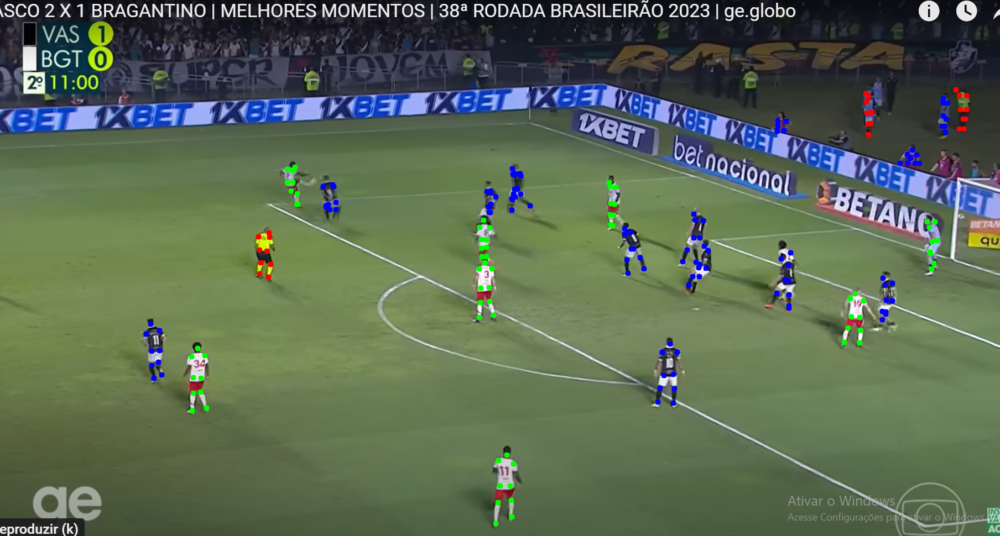

In [127]:
plot_from_filename(f"/content/teste3.png", panoptic_predictor, keypoint_predictor)

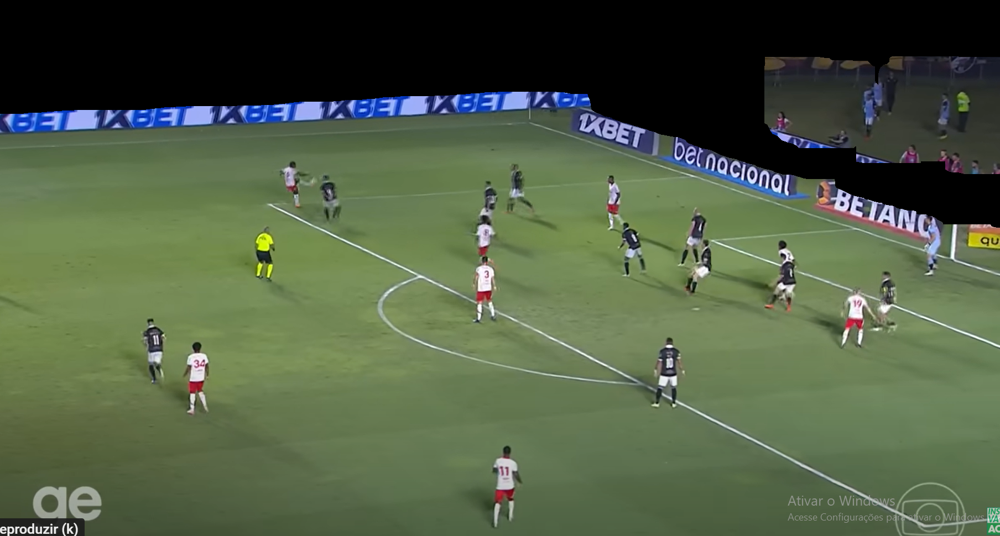

In [131]:
image = cv2.imread(f"/content/teste3.png")
edited = isolate_field(image, panoptic_predictor)

cv2_imshow(edited)